# Lab Three - Clustering


Team Members
* Chance Robinson
* Dan Crouthamel
* Shane Weinstock

# Business Understanding 1


_Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?_

In [1]:
# Base Imports
import pandas as pd
import numpy as np 
import time
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator
import seaborn as sns
%matplotlib inline

# Pre-Processing
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# Metrics and Evaluation
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import plot_roc_curve

# Train/ Test Split
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.pipeline import Pipeline

# Imbalanced Data
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.pipeline import make_pipeline, Pipeline

# Estimators
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# Hyper Parameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# T-Tests
from mlxtend.evaluate import paired_ttest_5x2cv

# Machine Learning Visualizations
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
from yellowbrick.classifier import ClassificationReport



## Load Data

# Data Understanding 1

_Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?_


In [2]:
df = pd.read_csv('../../../../../../data/cardio_train.csv', delimiter=';')
# set id as index
df.set_index("id", inplace=True)
# copy original data
df_clean = df.copy(deep=True)
# drop duplicates
df_clean.drop_duplicates(inplace=True)

## Apply Transformations

In [3]:
# %%time

# # Convert age into years
# df_clean['age'] = (df_clean['age'] / 365).round().astype('int')

# re-encode gender to male (1) and female (0)
df_clean['gender'] = np.where((df_clean.gender == 2), 1, 0)

# # compute the body mass index based on weight and height
# df_clean['bmi'] = df_clean['weight'] / (df_clean['height']/100)**2

# # create a BMI group
# df_clean['bmiGrp'] = np.where((df_clean.bmi < 18.5), 1, 0)
# df_clean['bmiGrp'] = np.where((df_clean.bmi >= 18.5) & (df_clean.bmi < 25), 2, df_clean.bmiGrp)
# df_clean['bmiGrp'] = np.where((df_clean.bmi >= 25) & (df_clean.bmi < 30), 3, df_clean.bmiGrp)
# df_clean['bmiGrp'] = np.where((df_clean.bmi >= 30), 4, df_clean.bmiGrp)

# # bin blood pressure groups based on the api hi/ lo variables
# df_clean['bp'] = np.where((df_clean.ap_hi < 120) & (df_clean.ap_lo < 80), 1, 0)
# df_clean['bp'] = np.where((df_clean.ap_hi >= 120) & (df_clean.ap_hi < 130) & (df_clean.ap_lo < 80), 2, df_clean.bp)
# df_clean['bp'] = np.where((df_clean.ap_hi >= 130) & (df_clean.ap_hi < 140) | ((df_clean.ap_lo >= 80) & (df_clean.ap_lo < 90)), 3, df_clean.bp)
# df_clean['bp'] = np.where((df_clean.ap_hi >= 140) | (df_clean.ap_lo >= 90), 4, df_clean.bp)
# df_clean['bp'] = np.where((df_clean.ap_hi > 180) | (df_clean.ap_lo > 120), 5, df_clean.bp)



**Table 1: Cardiovascular Dataset - Attribute Descriptions**

| Column Description | Feature Type | Column Name | Data Type |
|:---|:---|:---|:---|
| **Age**                        | Objective | age | int (days) |
| **Height**                     | Objective | height | int (cm) |
| **Weight**                     | Objective | weight | float (kg) |
| **Gender**                     | Objective | gender | 0: female, 1: male |
| **Systolic blood pressure**    | Examination | ap_hi | int |
| **Diastolic blood pressure**   | Examination | ap_lo | int |
| **Cholesterol**                | Examination | cholesterol | 1: normal, 2: above normal, 3: well above normal |
| **Glucose**                    | Examination | gluc | 1: normal, 2: above normal, 3: well above normal |
| **Smoking**                    | Subjective  | smoke | binary |
| **Alcohol intake**             | Subjective | alco | binary |
| **Physical activity**          | Subjective | active | binary |
| **Has CVD?**                   | Target * | cardio | binary |

In [4]:
df_clean.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000
mean,19468.950126,0.349648,164.359152,74.208519,128.820453,96.636261,1.366997,1.226535,0.088159,0.053790,0.803718,0.499771
std,2467.374620,0.476862,8.211218,14.397211,154.037729,188.504581,0.680333,0.572353,0.283528,0.225604,0.397187,0.500004
min,10798.000000,0.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17664.000000,0.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,0.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,1.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,1.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


### Baseline Classification Performance

In [5]:
from sklearn.model_selection import StratifiedKFold, cross_val_score

numeric_features = ['age', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc']
categorical_features = ['gender', 'smoke', 'alco', 'active']

# Impute Numeric Features with the mean value

# One Hot Encode Categorical Features

# Robust Scaler
from sklearn.preprocessing import RobustScaler
rs = RobustScaler()
df_clean[["age", "height", "weight", "ap_hi", "ap_lo"]] = rs.fit_transform(df_clean[["age", "height", "weight", "ap_hi", "ap_lo"]])


X_cols = ['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']

y = df_clean['cardio']
X = df_clean[X_cols]
cv = StratifiedKFold(n_splits=10)

clf_logreg = LogisticRegression(random_state=1, penalty='l2', C=0.1)


roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)



Average ROC (AUC) =  78.44928456638837 +- 0.5894112154324848


# Data Understanding 2


_Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs._



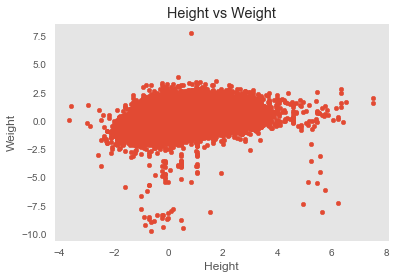

In [6]:
from matplotlib import pyplot as plt
plt.style.use("ggplot")

%matplotlib inline
X1 = df_clean[['height','weight']].values

plt.scatter(X1[:, 1], X1[:, 0]+np.random.random(X1[:, 1].shape)/2, 
             s=20)
plt.xlabel('Height'), plt.ylabel('Weight')
plt.grid()
plt.title('Height vs Weight')
plt.show()

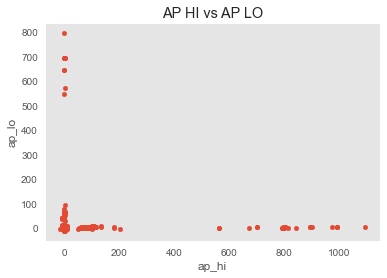

In [7]:
X1 = df_clean[['ap_hi','ap_lo']].values

plt.scatter(X1[:, 1], X1[:, 0]+np.random.random(X1[:, 1].shape)/2, 
             s=20)
plt.xlabel('ap_hi'), plt.ylabel('ap_lo')
plt.grid()
plt.title('AP HI vs AP LO')
plt.show()

# Modeling and Evaluation 1


_Train and adjust parameters_

## KMeans

In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
cv = StratifiedKFold(n_splits=10)

### Height and Weight

In [9]:
X1 = df_clean[['height','weight']]

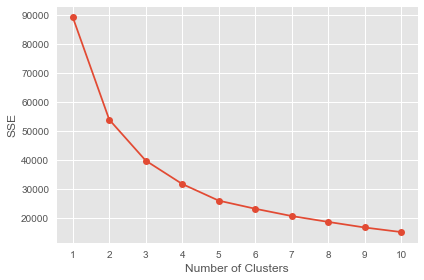

In [10]:
sse = []
# silhouette_coefficients = []

for i in range(1, 11):
    km = KMeans(n_clusters=i, init="k-means++", n_init=10, max_iter=300, random_state=1, n_jobs=-1)
    km.fit(X1)
    # score = silhouette_score(X1, km.labels_)
    sse.append(km.inertia_)
    # silhouette_coefficients.append(score)

plt.plot(range(1, 11), sse, marker='o')
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.tight_layout()
plt.show()


In [11]:
from kneed import KneeLocator

kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")

n_clusters = kl.elbow
n_clusters

3

In [12]:
km = KMeans(n_clusters=n_clusters, init='k-means++',random_state=1, n_jobs=-1)
km.fit(X1)
new_feature = km.labels_ # the labels from kmeans clustering

y = df_clean['cardio']
X = df_clean[['age', 'gender', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]

X = np.column_stack((X, pd.get_dummies(new_feature)))

roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)

Average ROC (AUC) =  78.40287527806831 +- 0.601618395992261


### Systolic blood pressure	(ap_hi) and Diastolic blood pressure (ap_lo)

In [13]:
X1 = df_clean[['ap_hi','ap_lo']]

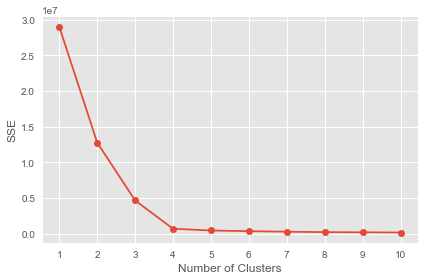

In [14]:
sse = []
# silhouette_coefficients = []

for i in range(1, 11):
    km = KMeans(n_clusters=i, init="k-means++", n_init=10, max_iter=300, random_state=1, n_jobs=-1)
    km.fit(X1)
    # score = silhouette_score(X1, km.labels_)
    sse.append(km.inertia_)
    # silhouette_coefficients.append(score)

plt.plot(range(1, 11), sse, marker='o')
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.tight_layout()
plt.show()

In [15]:
from kneed import KneeLocator

kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")

n_clusters = kl.elbow
n_clusters

4

In [16]:
km = KMeans(n_clusters=90, init='k-means++', random_state=1, n_jobs=-1)
km.fit(X1)
new_feature = km.labels_ # the labels from kmeans clustering

y = df_clean['cardio']
X = df_clean[['age', 'gender', 'height', 'weight', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]

X = np.column_stack((X, pd.get_dummies(new_feature)))

roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)

Average ROC (AUC) =  79.63778139313764 +- 0.5528341136946631


## Mean Shift

In [17]:
from sklearn.cluster import MeanShift, estimate_bandwidth

X1 = df_clean[['ap_hi','ap_lo']]

y = df_clean['cardio']
X = df_clean[['age', 'gender', 'height', 'weight', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]

# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(X1, quantile=0.2, n_samples=300, n_jobs=-1)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
ms.fit(X1)
labels = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)


X = np.column_stack((X, pd.get_dummies(labels)))

roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)

number of estimated clusters : 67
Average ROC (AUC) =  70.21350351653307 +- 0.6512522269882381


## Hierarchical Clustering

In [18]:
# from sklearn.cluster import AgglomerativeClustering

# X1 = df_clean[['height','weight']]

# params = []
# for link in ['ward', 'complete', 'average']:
#     for n_cls in range(3,6):

#         # append on the clustering
#         cls_fam = AgglomerativeClustering(n_clusters=n_cls, linkage=link)
#         cls_fam.fit(X1)
#         new_feature = cls_fam.labels_ # the labels from kmeans clustering

#         y = df_clean['cardio']
#         X = df_clean[['age', 'gender', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]


#         X = np.column_stack((X, pd.get_dummies(new_feature)))

#         acc = cross_val_score(clf_logreg, X, y=y, cv=cv)
#         params.append((n_cls, acc.mean()*100, acc.std()*100)) # save state

#         print ("C=", n_cls,link, "Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

In [19]:
from sklearn.cluster import AgglomerativeClustering

y = df_clean['cardio']
X = df_clean[X_cols]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# X1 = X_train[['height','weight']]
X1 = X_train[['ap_hi','ap_lo']]

# X = X_train[['age', 'gender', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]
X = X_train[['age', 'gender', 'height', 'weight', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]
y = y_train

# append on the clustering
cls_fam = AgglomerativeClustering(n_clusters=67, linkage="ward")
cls_fam.fit(X1)
new_feature = cls_fam.labels_ # the labels from kmeans clustering


X = np.column_stack((X, pd.get_dummies(new_feature)))

roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)


Average ROC (AUC) =  79.47924658651735 +- 0.8172683900598172


- Average ROC (AUC) =  78.37428383540914 +- 0.6528568367840516
- Average ROC (AUC) =  78.62388084698132 +- 0.8477734191186446

## Gaussian Mixtures

In [20]:

# this code has been manipulated from the source available on sklearn's website documentation
import itertools
from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn import mixture

X1 = df_clean[['ap_hi','ap_lo']]

y = df_clean['cardio']
X = df_clean[['age', 'gender', 'height', 'weight', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]


lowest_bic = np.infty
bic = []
n_components_range = range(3, 6)
cv_types = ['spherical', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a mixture of Gaussians with EM
        gmm = mixture.GaussianMixture(n_components=n_components, covariance_type=cv_type)
        gmm.fit(X1)
        bic.append(gmm.bic(X1))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm
            best_cv_type = cv_type

In [21]:
best_gmm

GaussianMixture(covariance_type='spherical', n_components=5)

In [22]:
best_cv_type

'spherical'

In [23]:
# this code has been manipulated from the source available on sklearn's website documentation
import itertools
from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn import mixture

X1 = df_clean[['ap_hi','ap_lo']]

y = df_clean['cardio']
X = df_clean[['age', 'gender', 'height', 'weight', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]

gmm = mixture.GaussianMixture(n_components=5, covariance_type="spherical")
gmm.fit(X1)

X = np.column_stack((X1, pd.get_dummies(labels)))

roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')
print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)


Average ROC (AUC) =  74.99936324735116 +- 0.6856614635459174


## DBSCAN

In [24]:
# %%time 
# from sklearn.cluster import DBSCAN

# X1 = df_clean[['height','weight']]

# params = []
# for eps in [0.05, 0.04, 0.03]:
#     for mpts in range(3,4):

#         # append on the clustering
#         cls_fam = DBSCAN(eps=eps, min_samples=mpts, n_jobs=-1)
#         cls_fam.fit(X1)
#         newfeature_fam = cls_fam.labels_ # the labels from kmeans clustering

#         y = df_clean['cardio']
#         X = df_clean[['age', 'gender', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]
#         X = np.column_stack((X,pd.get_dummies(newfeature_fam)))

        
#         roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

#         print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)

In [25]:
%%time 
from sklearn.cluster import DBSCAN

X1 = df_clean[['ap_hi','ap_lo']]

params = []
for eps in [0.1, 0.05]:
    for mpts in range(2, 5):

        # append on the clustering
        cls_fam = DBSCAN(eps=eps, min_samples=mpts, n_jobs=-1)
        cls_fam.fit(X1)
        newfeature_fam = cls_fam.labels_ # the labels from kmeans clustering

        y = df_clean['cardio']
        X = df_clean[['age', 'gender', 'height', 'weight', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']]
        X = np.column_stack((X,pd.get_dummies(newfeature_fam)))

        roc = cross_val_score(clf_logreg, X, y=y, cv=cv, scoring='roc_auc')

        print ("Average ROC (AUC) = ", roc.mean()*100, "+-", roc.std()*100)


Average ROC (AUC) =  77.81226351328027 +- 0.5786485021420859
Average ROC (AUC) =  77.81322338726217 +- 0.5775106114870397
Average ROC (AUC) =  77.81787045139083 +- 0.5878854838867232
Average ROC (AUC) =  79.32125719276283 +- 0.5625880526977937
Average ROC (AUC) =  79.32157019396216 +- 0.5643114612867566
Average ROC (AUC) =  79.32297679188231 +- 0.5639285475003257
Wall time: 3min 20s


# Modeling and Evaluation 2


_Evaluate and Compare_


# Modeling and Evaluation 3


_Visualize Results_

# Modeling and Evaluation 4

_Summarize the Ramifications_



# Deployment 


_Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling? How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.?_

# Exceptional Work


_You have free reign to provide additional analyses or combine analyses._


In [26]:
X_cols = ['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']

y = df_clean['cardio']

X = df_clean[X_cols]

clf_logreg = LogisticRegression(random_state=1)

pipe_logreg = Pipeline([['clf', clf_logreg]])

model_params = {
    # "logisticregression": {
    #     "model": pipe_logreg,
    #     "params": {
    #         "clf__C": [.01, .1, 1, 5, 10, 25, 50],
    #         "clf__penalty": ["l1", "l2"]
    #     }
    # }
}

scores = []

for model_name, mp in model_params.items():
    start = time.time()
    clf = GridSearchCV(estimator = mp["model"], param_grid=mp["params"], cv=10, scoring="roc_auc", n_jobs=-1)
    # clf = RandomizedSearchCV(estimator = mp["model"], param_distributions=mp["params"], cv=10, scoring="roc_auc", n_jobs=-1)
    clf.fit(X, y)
    elapsed_time = (time.time() - start)

    scores.append({"Model": model_name,
    "Best ROC AUC": clf.best_score_, # Mean cross-validated score of the best_estimator
    "Best Params": clf.best_params_,
    "results": clf.cv_results_,
    "Cross Validation Time": elapsed_time,
    "Best Estimator": clf.best_estimator_
    })

In [27]:
print('10 Fold Cross Validation Scores (Smoker):')

for model in scores:
    print()
    for key, value in model.items():
        if key == 'Best Estimator':
            print("Prediction Accuracy",': ',value.score(X, y))
        elif key == 'results':
            print('Mean Fit Time: ', value['mean_fit_time'].mean())
            print('Mean Score Time: ', value['mean_score_time'].mean())
        else:
            print(key,': ',value)

10 Fold Cross Validation Scores (Smoker):
